# Machine Learning in R

In [185]:
# Preliminaries
library(mlr)      # ML librabry
library(OpenML)   # ML datasets, models, sharing

# Plotting
library(ggplot2)  
library(cowplot)
library(parallelMap)
library(gridExtra)

# Data manipulation
library(plyr)

# mlr configs
options(width = 70)
configureMlr(show.info = FALSE)
configureMlr(show.learner.output = FALSE)

# OpenML config to set your API key (only do this once)
# setOMLConfig(apikey = qwertyuiop1234567890, verbosity=0)

# If you want all algorithms in mlr, install the dependencies
# install.packages(c("party","RWeka","e1071","rpart","car","ada","bartMachine","kohonen","mboost","adabag","bst","brnn",
#                   "SwarmSVM","LiblineaR","glmnet","deepnet","extraTrees","FNN","gbm","DiscriMiner","sparsediscrim",
#                   "kknn","class","kernlab","MASS","lqa","mda","RSNNS","neuralnet","nodeHarvest","pamr","stepPlr",
#                    caret","randomForest","randomForestSRC","ranger","klaR","rFerns","rknn","rotationForest",
#                   "rrlda","sda","sparseLDA","elasticnet","xgboost","tgp","crs","Cubist","earth","elmNN","frbs",
#                   "DiceKriging","laGP","pls","penalized","rsm","flare","clue","fpc","CoxBoost","pROC"))

## Machine learning packages in R

- The Good: hundreds of ML packages, many comply to an unwritten interface definition
```R
model = fit(target ~ ., data = train.data, ...)
predictions = predict(model, newdata = test.data, ...)
```
- The Bad: some have different API, many others have package-dependent functionality for general procedures
- The Ugly: meta-information and hyperparameters buried in docs (if documented at all), large experiments lead to tedious error-prone code 

# mlr package (machine learning in R)

- Domain-specific language for machine learning concepts
- Unified interface:
    - Tasks: data and meta-info (e.g. target features)
    - Learners: fit a model, make predictions
    - Resampling: evaluate a model, optimize hyperparameters
- Reflections: all objects are queryable, you can program on them
- OO structure: generic algorithms (Bagging, Stacking, Feature Selection,...)
- Guide: https://mlr-org.github.io/mlr-tutorial/
- Reference: http://rpackages.ianhowson.com/cran/mlr/

## mlr tasks

- Encapsulate data and meta-data about it (e.g. target features)
- Define precisely what you want to do with the data
- Types: regression, classification, clustering,...

Create regression task on the 'BostonHousing' dataset from the mlbench package

In [3]:
data(BostonHousing, package = "mlbench")
task = makeRegrTask(data = BostonHousing, target = "medv") 
print(task)

Supervised task: BostonHousing
Type: regr
Target: medv
Observations: 506
Features:
numerics  factors  ordered 
      12        1        0 
Missings: FALSE
Has weights: FALSE
Has blocking: FALSE


### Task introspection: what's in a task?

In [4]:
names(task)               # objects in a task
names(task$task.desc)     # objects in the task description
str(getTaskId(task))      # a unique ID that we can track
getTaskSize(task)         # number of data points
getTaskFeatureNames(task) # feature names
getTaskTargetNames(task)  # name of target feature
summary(getTaskTargets(task)) # distribution of target values

[1] "type"      "env"       "weights"   "blocking"  "task.desc"

[1] "id"           "type"         "target"       "size"        
[5] "n.feat"       "has.missings" "has.weights"  "has.blocking"

 chr "BostonHousing"


[1] 506

[1] "crim"    "zn"      "indus"   "chas"    "nox"     "rm"     
 [7] "age"     "dis"     "rad"     "tax"     "ptratio" "b"      
[13] "lstat"

[1] "medv"

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
   5.00   17.02   21.20   22.53   25.00   50.00 

Get the actual data set from a task

In [5]:
data = getTaskData(task)
str(data)

'data.frame':	506 obs. of  14 variables:
 $ crim   : num  0.00632 0.02731 0.02729 0.03237 0.06905 ...
 $ zn     : num  18 0 0 0 0 0 12.5 12.5 12.5 12.5 ...
 $ indus  : num  2.31 7.07 7.07 2.18 2.18 2.18 7.87 7.87 7.87 7.87 ...
 $ chas   : Factor w/ 2 levels "0","1": 1 1 1 1 1 1 1 1 1 1 ...
 $ nox    : num  0.538 0.469 0.469 0.458 0.458 0.458 0.524 0.524 0.524 0.524 ...
 $ rm     : num  6.58 6.42 7.18 7 7.15 ...
 $ age    : num  65.2 78.9 61.1 45.8 54.2 58.7 66.6 96.1 100 85.9 ...
 $ dis    : num  4.09 4.97 4.97 6.06 6.06 ...
 $ rad    : num  1 2 2 3 3 3 5 5 5 5 ...
 $ tax    : num  296 242 242 222 222 222 311 311 311 311 ...
 $ ptratio: num  15.3 17.8 17.8 18.7 18.7 18.7 15.2 15.2 15.2 15.2 ...
 $ b      : num  397 397 393 395 397 ...
 $ lstat  : num  4.98 9.14 4.03 2.94 5.33 ...
 $ medv   : num  24 21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 ...


## OpenML integration

- There are many datasets available, but often hard to find, different formats,...
- Often no view on what are current state-of-the-art models for a dataset
- To compare, we need to rerun all other algorithms ourselves

**OpenML.org**: Collaboration platform for machine learning

- Datasets, models, evaluations shared by anyone (reproducible and reusable)
- Predefined tasks with train/test splits so that results are comparable
- Run large-scale experiments effortlessly, automatically share results
- Overview of state-of-the-art, leaderboards,...

### Load any dataset from OpenML

In [6]:
datasets = listOMLDataSets()  # fetches all data sets
nrow(datasets) # number of available datasets
datasets[1:20, c("did", "name", "NumberOfInstances", "NumberOfFeatures")]
# You can also view them online on www.openml.org/d/<did>

[1] 2417

,did,name,NumberOfInstances,NumberOfFeatures
1,1,anneal,898,39
2,2,anneal,898,39
3,3,kr-vs-kp,3196,37
4,4,labor,57,17
5,5,arrhythmia,452,280
6,6,letter,20000,17
7,7,audiology,226,70
8,8,liver-disorders,345,7
9,9,autos,205,26
10,10,lymph,148,19


### Search for specific datasets

In [7]:
# Show only a subset of dataset properties here
datacols = c("did", "name", "NumberOfInstances", "NumberOfFeatures", "NumberOfClasses")
subset(datasets, name == "iris")[, datacols]
subset(datasets, NumberOfInstances > 10000)[0:5, datacols]
subset(datasets, NumberOfClasses == 2)[0:5, datacols]

,did,name,NumberOfInstances,NumberOfFeatures,NumberOfClasses
55,61,iris,150,5,3
821,969,iris,150,5,2


,did,name,NumberOfInstances,NumberOfFeatures,NumberOfClasses
6,6,letter,20000,17,26
24,26,nursery,12960,9,5
30,32,pendigits,10992,17,10
57,70,"BNG(anneal,nominal,1000000)",1000000,39,6
58,71,"BNG(anneal.ORIG,nominal,1000000)",1000000,39,6


,did,name,NumberOfInstances,NumberOfFeatures,NumberOfClasses
3,3,kr-vs-kp,3196,37,2
4,4,labor,57,17,2
13,13,breast-cancer,286,10,2
15,15,breast-w,699,10,2
22,24,mushroom,8124,23,2


### Create an mlr task on an OpenML dataset

In [186]:
ddata = getOMLDataSet(did = 35)$data # Dermatology dataset (id=35), see openml.org/d/35  
task = makeClassifTask(data = ddata, target = "class")
print(task)

Supervised task: ddata
Type: classif
Target: class
Observations: 366
Features:
numerics  factors  ordered 
       1       33        0 
Missings: TRUE
Has weights: FALSE
Has blocking: FALSE
Classes: 6
  1   2   3   4   5   6 
112  61  72  49  52  20 
Positive class: NA


### Load predefined OpenML tasks
So you can use the same train/test samples as everyone else (and compare results)

In [9]:
omltask = getOMLTask(task.id = 35) # Classification on breast-cancer dataset (task_id=35), see openml.org/t/35  
print(omltask)
mlrtask = convertOMLTaskToMlr(omltask)$mlr.task # Optional: convert to MLR


OpenML Task 35 :: (Data ID = 35)
  Task Type            : Supervised Classification
  Data Set             : dermatology :: (Version = 1, OpenML ID = 35)
  Target Feature(s)    : class
  Estimation Procedure : Stratified crossvalidation (1 x 10 folds)


### List all OpenML tasks

In [10]:
tasks = listOMLTasks() # Fetches all tasks
# Only show a subset of task properties
taskcols = c("task.id","task.type","name","target.feature","estimation.procedure")
head(tasks[,taskcols])

,task.id,task.type,name,target.feature,estimation.procedure
1,1,Supervised Classification,anneal,class,10-fold Crossvalidation
2,2,Supervised Classification,anneal,class,10-fold Crossvalidation
3,3,Supervised Classification,kr-vs-kp,class,10-fold Crossvalidation
4,4,Supervised Classification,labor,class,10-fold Crossvalidation
5,5,Supervised Classification,arrhythmia,class,10-fold Crossvalidation
6,6,Supervised Classification,letter,class,10-fold Crossvalidation


### Search for specific tasks

In [11]:
subset(tasks, name == "breast-cancer")[, taskcols]

,task.id,task.type,name,target.feature,estimation.procedure
13,13,Supervised Classification,breast-cancer,Class,10-fold Crossvalidation
66,72,Learning Curve,breast-cancer,Class,10 times 10-fold Learning Curve
231,243,Supervised Classification,breast-cancer,Class,33% Holdout set
341,1712,Learning Curve,breast-cancer,Class,10-fold Learning Curve
402,1777,Supervised Classification,breast-cancer,Class,5 times 2-fold Crossvalidation
511,1893,Supervised Classification,breast-cancer,Class,10 times 10-fold Crossvalidation
566,1954,Supervised Classification,breast-cancer,Class,Leave one out
698,2181,Supervised Data Stream Classification,breast-cancer,Class,Interleaved Test then Train
2865,5533,Clustering,breast-cancer,NA,50 times Clustering
4881,10125,Clustering,breast-cancer,NA,50 times Clustering


## mlr learners

- Wrappers around `fit()` and `predict()` functions
- Learners: 73 Classification, 54 Regression, 8 Clustering,...
- Descriptions of parameter sets
- Annotations (e.g. handles missing values)
- Naming convention `<tasktype>.<functionname>`
```r
makeLearner("classif.rpart")
makeLearner("regr.rpart")
```

### Create learner
Initializes a learner with default hyperparameters, not trained yet. Naming convention: `<task>.<algorithm>`


In [12]:
lrn = makeLearner("classif.rpart")
print(lrn)

Learner classif.rpart from package rpart
Type: classif
Name: Decision Tree; Short name: rpart
Class: classif.rpart
Properties: twoclass,multiclass,missings,numerics,factors,ordered,prob,weights
Predict-Type: response
Hyperparameters: xval=0



Search for available learners via the help page `?learners` or `listLearners()`  

In [13]:
?learners

learners {mlr},R Documentation


In [14]:
listLearners()[0:10,c(1,2,5,20)]

,class,type,name,note
1,classif.ada,classif,ada Boosting,`xval` has been set to `0` by default for speed.
2,classif.avNNet,classif,Neural Network,`size` has been set to `3` by default. Doing bagging training of `nnet` if set `bag = TRUE`.
3,classif.bartMachine,classif,Bayesian Additive Regression Trees,`use_missing_data` has been set to `TRUE` by default to allow missing data support.
4,classif.bdk,classif,Bi-Directional Kohonen map,
5,classif.binomial,classif,Binomial Regression,Delegates to `glm` with freely choosable binomial link function via learner parameter `link`.
6,classif.blackboost,classif,Gradient Boosting With Regression Trees,See `?ctree_control` for possible breakage for nominal features with missingness.
7,classif.boosting,classif,Adabag Boosting,`xval` has been set to `0` by default for speed.
8,classif.bst,classif,Gradient Boosting,"Renamed parameter `learner` to `Learner` due to nameclash with `setHyperPars`. Default changes: `Learner = ""ls""`, `xval = 0`, and `maxdepth = 1`."
9,classif.cforest,classif,Random forest based on conditional inference trees,See `?ctree_control` for possible breakage for nominal features with missingness.
10,classif.clusterSVM,classif,Clustered Support Vector Machines,`centers` set to `2` by default.


In [15]:
# list all classification learners which can handle missing values 
listLearners("classif", properties = c("missings"))[, 1:4]

,class,type,package,short.name
1,classif.bartMachine,classif,bartMachine,bartmachine
2,classif.blackboost,classif,"mboost,party",blackbst
3,classif.boosting,classif,"adabag,rpart",adabag
4,classif.cforest,classif,party,cforest
5,classif.ctree,classif,party,ctree
6,classif.gbm,classif,gbm,gbm
7,classif.J48,classif,RWeka,j48
8,classif.JRip,classif,RWeka,jrip
9,classif.naiveBayes,classif,e1071,nbayes
10,classif.OneR,classif,RWeka,oner


In [16]:
# list all classification learners that can handle the current task 
listLearners(task)[, 1:4]

,class,type,package,short.name
1,classif.boosting,classif,"adabag,rpart",adabag
2,classif.cforest,classif,party,cforest
3,classif.ctree,classif,party,ctree
4,classif.gbm,classif,gbm,gbm
5,classif.J48,classif,RWeka,j48
6,classif.JRip,classif,RWeka,jrip
7,classif.naiveBayes,classif,e1071,nbayes
8,classif.OneR,classif,RWeka,oner
9,classif.PART,classif,RWeka,part
10,classif.randomForestSRC,classif,randomForestSRC,rfsrc


### Hyperparameters
List all hyperparameters

In [17]:
lrn = makeLearner("classif.rpart")
getParamSet(lrn)

                   Type len  Def   Constr Req Tunable Trafo
minsplit        integer   -   20 1 to Inf   -    TRUE     -
minbucket       integer   -    - 1 to Inf   -    TRUE     -
cp              numeric   - 0.01   0 to 1   -    TRUE     -
maxcompete      integer   -    4 0 to Inf   -    TRUE     -
maxsurrogate    integer   -    5 0 to Inf   -    TRUE     -
usesurrogate   discrete   -    2    0,1,2   -    TRUE     -
surrogatestyle discrete   -    0      0,1   -    TRUE     -
maxdepth        integer   -   30  1 to 30   -    TRUE     -
xval            integer   -   10 0 to Inf   -   FALSE     -
parms           untyped   -    -        -   -   FALSE     -

Setting hyperparameters at creation time

In [18]:
cluster.lrn = makeLearner("cluster.SimpleKMeans", N = 5)
lrn = makeLearner("classif.rpart", par.vals = list(maxdepth = 10, cp = 0.1))
lrn

Learner classif.rpart from package rpart
Type: classif
Name: Decision Tree; Short name: rpart
Class: classif.rpart
Properties: twoclass,multiclass,missings,numerics,factors,ordered,prob,weights
Predict-Type: response
Hyperparameters: xval=0,maxdepth=10,cp=0.1


You can change parameter values at any time, or go back to default values

In [19]:
# Afterwards
setHyperPars(lrn,maxdepth=20)
# Go back to defaults
removeHyperPars(lrn,c("maxdepth","cp"))

Learner classif.rpart from package rpart
Type: classif
Name: Decision Tree; Short name: rpart
Class: classif.rpart
Properties: twoclass,multiclass,missings,numerics,factors,ordered,prob,weights
Predict-Type: response
Hyperparameters: xval=0,maxdepth=20,cp=0.1


Learner classif.rpart from package rpart
Type: classif
Name: Decision Tree; Short name: rpart
Class: classif.rpart
Properties: twoclass,multiclass,missings,numerics,factors,ordered,prob,weights
Predict-Type: response
Hyperparameters: xval=0


### Learner properties

- numerics, factors, ordered: Handles numeric, factors (categories), ordered features
- missings: Handles missing values in the data
- weights: Training examples can be weighted
- oneclass, twoclass, multiclass: Handles 1,2, multi-class classification problems
- class.weights: Handles class weights
- prob: Can predict probabilities
- se: Can predict standard errors (for regression)

Querying and setting learner properties

In [20]:
class_tree = makeLearner("classif.rpart")
regr_forest = makeLearner("regr.randomForest")
class_tree$properties
setPredictType(class_tree, "prob")
setPredictType(regr_forest, "se")

[1] "twoclass"   "multiclass" "missings"   "numerics"   "factors"   
[6] "ordered"    "prob"       "weights"

Learner classif.rpart from package rpart
Type: classif
Name: Decision Tree; Short name: rpart
Class: classif.rpart
Properties: twoclass,multiclass,missings,numerics,factors,ordered,prob,weights
Predict-Type: prob
Hyperparameters: xval=0


Learner regr.randomForest from package randomForest
Type: regr
Name: Random Forest; Short name: rf
Class: regr.randomForest
Properties: numerics,factors,ordered,se
Predict-Type: se
Hyperparameters: se.method=bootstrap,se.boot=50,ntree.for.se=100


### Training a learner

- Training: fitting a model to the given data (as defined in a task)

In [21]:
iristask = convertOMLTaskToMlr(getOMLTask(task.id=59))$mlr.task 
lrn = makeLearner("classif.rpart")
model = train(lrn,iristask)
names(model)
model$learner.model

[1] "learner"       "learner.model" "task.desc"     "subset"       
[5] "features"      "factor.levels" "time"

n= 150 

node), split, n, loss, yval, (yprob)
      * denotes terminal node

1) root 150 100 Iris-setosa (0.33333333 0.33333333 0.33333333)  
  2) petallength< 2.45 50   0 Iris-setosa (1.00000000 0.00000000 0.00000000) *
  3) petallength>=2.45 100  50 Iris-versicolor (0.00000000 0.50000000 0.50000000)  
    6) petalwidth< 1.75 54   5 Iris-versicolor (0.00000000 0.90740741 0.09259259) *
    7) petalwidth>=1.75 46   1 Iris-virginica (0.00000000 0.02173913 0.97826087) *

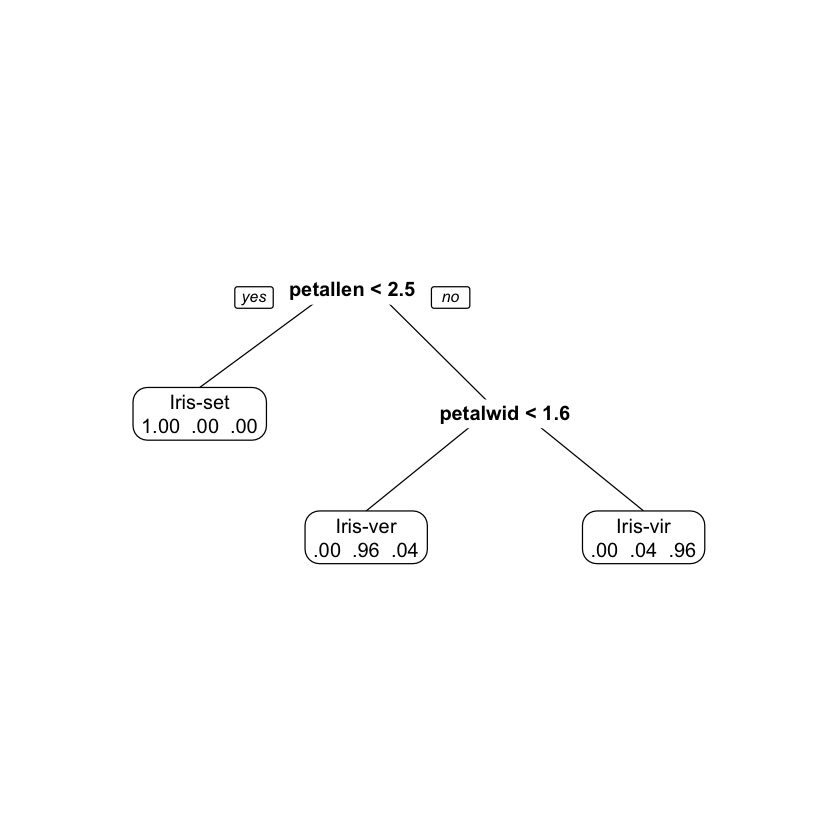

In [85]:
library(rpart.plot) # For plotting rpart trees
rpart.plot(model$learner.model, extra = 4)

### Making predictions

- Given a trained model, make predictions for a test set

In [22]:
n = getTaskSize(iristask)
train.set = seq(1, n, by = 2) # odd rows for training
test.set = seq(2, n, by = 2)  # even rows for testing
model = train(lrn, iristask, subset = train.set) # train with subbset
pred = predict(model, task = iristask, subset = test.set) # predict the rest
pred

Prediction: 75 observations
predict.type: response
threshold: 
time: 0.02
   id       truth    response
1   2 Iris-setosa Iris-setosa
3   4 Iris-setosa Iris-setosa
5   6 Iris-setosa Iris-setosa
7   8 Iris-setosa Iris-setosa
9  10 Iris-setosa Iris-setosa
11 12 Iris-setosa Iris-setosa

### Visualizing predictions

- mlr includes several functions to visualize learning performance
- returns a ggplot object which you can manipulate as usual

Classification: only 2D visualizations

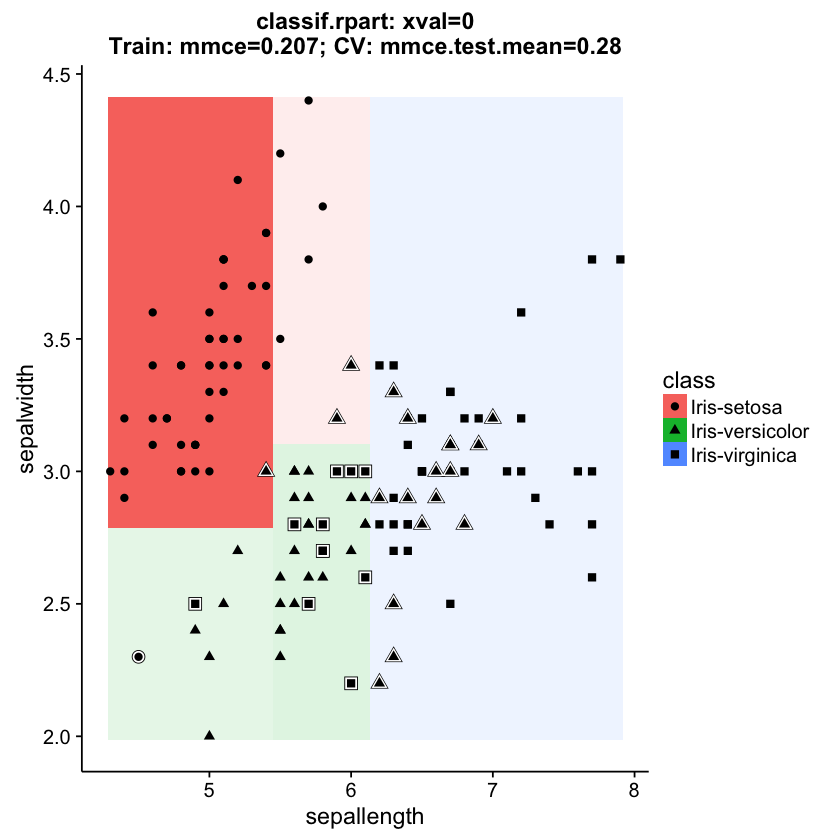

In [23]:
lrn = makeLearner("classif.rpart")
plotLearnerPrediction(lrn, iristask, features = c("sepallength", "sepalwidth")) + theme_cowplot()

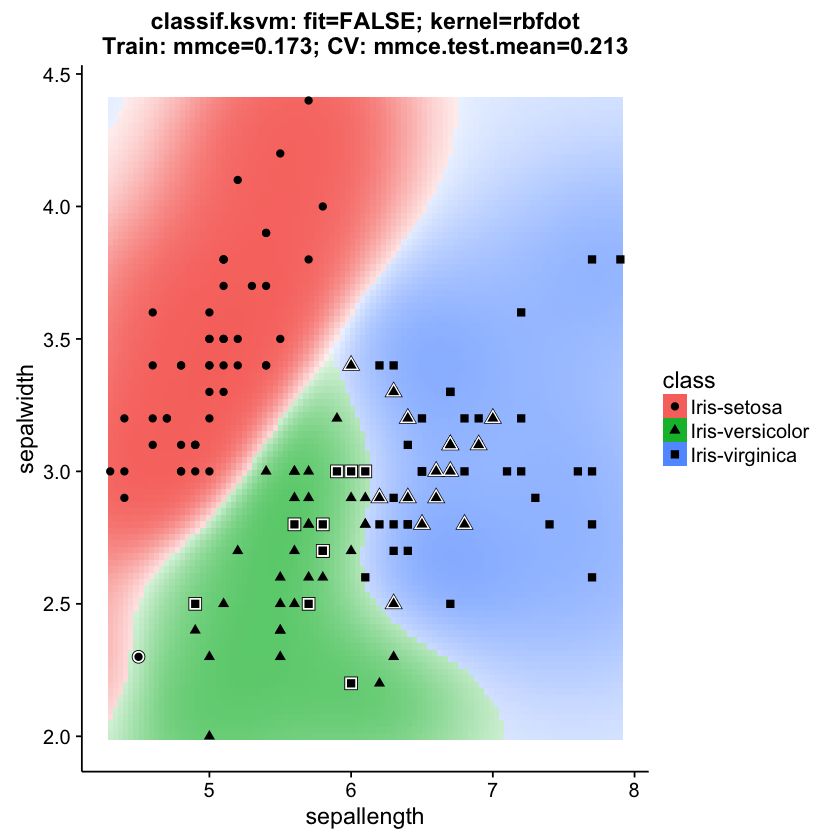

In [24]:
# Learner parameters can be passed in the plotting function
lrn = makeLearner("classif.ksvm")
plotLearnerPrediction(lrn, iristask, kernel = "rbfdot", features = c("sepallength", "sepalwidth")) + theme_cowplot()

Regression: 1D and 2D visualizations

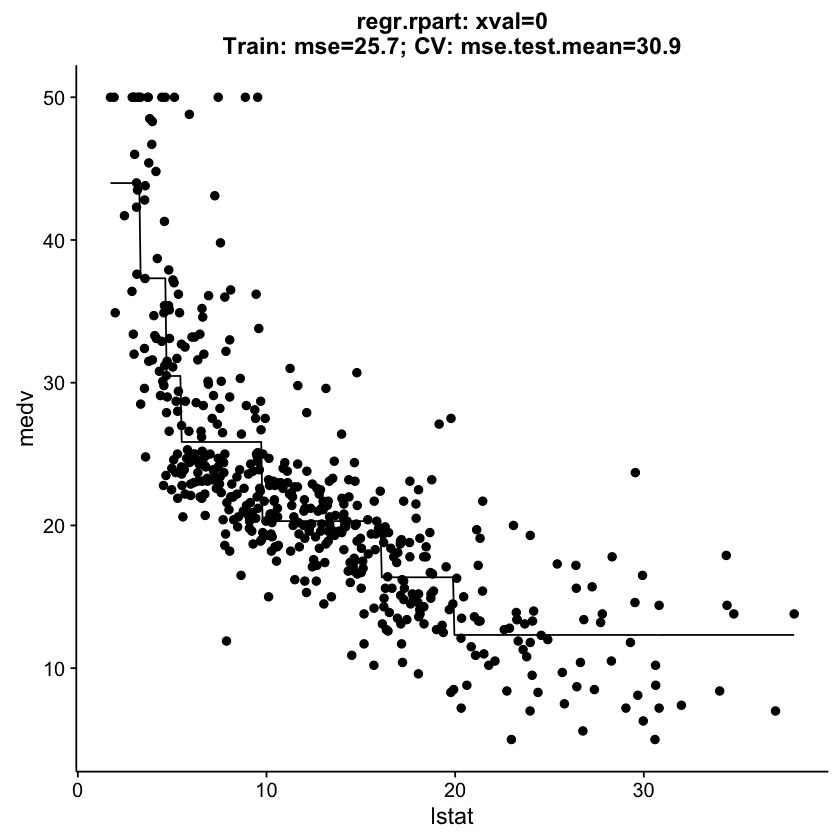

In [194]:
data(BostonHousing, package = "mlbench")
bh.task = makeRegrTask(data = BostonHousing, target = "medv")
lrn = makeLearner("regr.rpart")
plotLearnerPrediction(lrn, bh.task, features = c("lstat"))

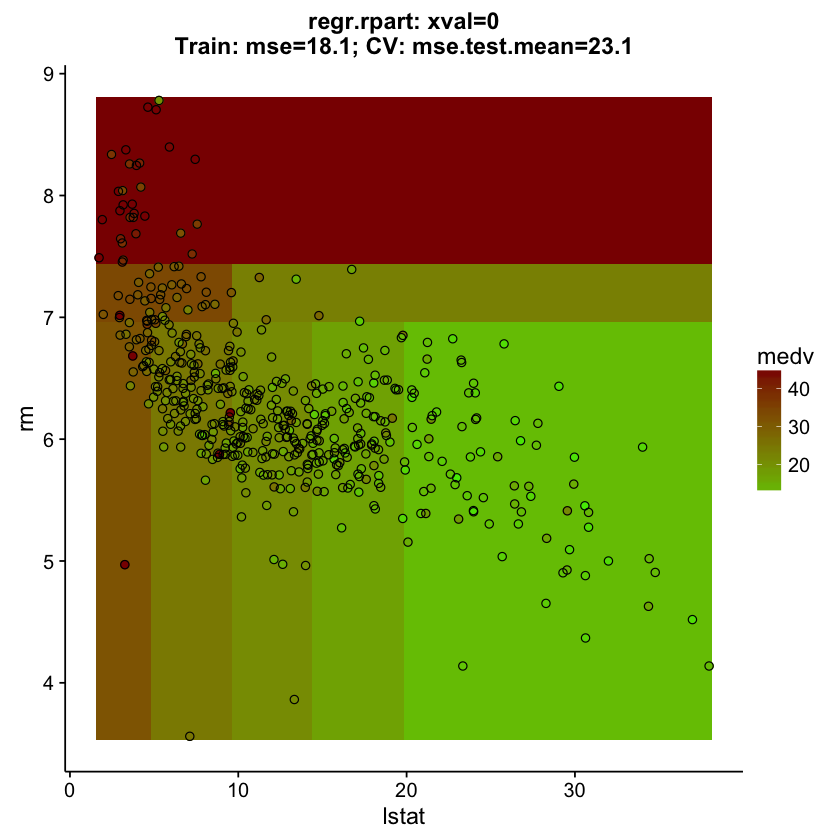

In [26]:
lrn = makeLearner("regr.rpart")
plotLearnerPrediction(lrn, bh.task, features = c("lstat","rm"))

## mlr resampling (evaluation)

- Estimate generalization error of our models
- Repeatedly fit models on training sets
- Evaluate performance on independent test sets and average performance results

### Evaluation measures

- Default measure for classification: Mean misclassification error (mmce)
$$ \frac{1}{n} \sum_{i=1}^n \mathbb{1}(y_i \neq \hat{y}_i) $$

- Default measure for regression: Mean squared error (mse)
$$ \frac{1}{n} \sum_{i = 1}^{n}(y_i - \hat{y}_i)^2 $$

In [27]:
listMeasures("classif") # All available classification measures
print(mmce)
listMeasures("regr") # All available regression measures
print(mse)

[1] "timepredict"    "gmean"          "acc"           
 [4] "auc"            "ber"            "fn"            
 [7] "fp"             "fnr"            "gpr"           
[10] "featperc"       "ppv"            "fpr"           
[13] "mmce"           "timeboth"       "npv"           
[16] "timetrain"      "fdr"            "tnr"           
[19] "mcc"            "bac"            "tpr"           
[22] "tn"             "f1"             "tp"            
[25] "multiclass.auc" "brier"

Name: Mean misclassification error
Performance measure: mmce
Properties: classif,classif.multi,req.pred,req.truth
Minimize: TRUE
Best: 0; Worst: 1
Aggregated by: test.mean
Note: 


[1] "timepredict" "sae"         "sse"         "rmse"       
 [5] "expvar"      "rsq"         "featperc"    "arsq"       
 [9] "timeboth"    "timetrain"   "mae"         "mse"        
[13] "medae"       "medse"

Name: Mean of squared errors
Performance measure: mse
Properties: regr,req.pred,req.truth
Minimize: TRUE
Best: 0; Worst: Inf
Aggregated by: test.mean
Note: 


Evaluations are included in the predictions object

In [48]:
lrn = makeLearner("classif.rpart")
lrn = setPredictType(lrn, "prob") # We need probabilities
model = train(lrn, iristask, subset = train.set) # train with subbset
pred = predict(model, task = iristask, subset = test.set) # predict the rest
performance(pred)
performance(pred, measures = list(mlr::multiclass.auc, mlr::acc))
# timetrain also needs the model
performance(pred, measures = mlr::timetrain, model = model)

mmce 
0.05333333

multiclass.auc            acc 
     0.8333333      0.9466667

timetrain 
    0.005

### Resampling strategies

- Cross-validation (`CV`): Split data in $k$ roughly equal parts (folds), iteratively use one as the test set and the remainder as the training set, then average the performance estimates. $k$ typically 5..10.
- Repeated Cross-validation (`RepCV`): Repeat CV $i$ times (randomly shuffling the data points), and average the CV results
- Leave-one-out Cross-validation (`LOO`): Cross-Validation with $k$ = $n$ = the number of data points 
- Holdout, training/test (`Holdout`): Randomly split the data in a train and test set. Typically 70/30 split.
- Subsampling, a.k.a Monte-Carlo Cross-Validation (`Subsample`). Draw $k$ random holdouts, and average the results. $k$ typically 30..100 

- Out-of-bag bootstrap (`Bootstrap`): Randomly draw $B$ training sets of size $n$ with replacement (points can be drawn more than once). These are expected to contain 63,2% of the original data points. The non-drawn (out-of-bag, OOB) points form the test sets. $B$ typically 30..100 
- Bootstrapping with the 632-rule (`B632`): Variant of OOB bootstrapping that takes a weighted average of the OOB bootstrap estimate and the training set error on the whole dataset. Less pessimistic than the OOB bootstrap.
- Stratified resampling: Option for all strategies, creates splits so that class labels occur in equal proportions as in the original data

First create resample description, then execute with learner and task. Returned resample object contains all performance estimates.

In [69]:
rdesc = makeResampleDesc("CV", iters = 3)
lrn = makeLearner("classif.rpart")
r = resample(lrn, iristask, resampling = rdesc)
print(r)
# Shorthand
r = crossval("classif.rpart", iristask, iters = 3)

Resample Result
Task: OpenML-Task-59
Learner: classif.rpart
mmce.aggr: 0.07
mmce.mean: 0.07
mmce.sd: 0.01
Runtime: 0.0765791


In [73]:
names(r)
head(r$measures.test) # Results per CV fold
head(as.data.frame(r$pred)) # Final predictions

[1] "learner.id"     "task.id"        "measures.train"
 [4] "measures.test"  "aggr"           "pred"          
 [7] "models"         "err.msgs"       "extract"       
[10] "runtime"

,iter,mmce
1,1,0.06
2,2,0.06
3,3,0.06


,id,truth,response,iter,set
1,2,Iris-setosa,Iris-setosa,1,test
2,3,Iris-setosa,Iris-setosa,1,test
3,7,Iris-setosa,Iris-setosa,1,test
4,9,Iris-setosa,Iris-setosa,1,test
5,11,Iris-setosa,Iris-setosa,1,test
6,13,Iris-setosa,Iris-setosa,1,test


To retrieve the models, set `model=TRUE` and extract it from the resample object

In [87]:
r = resample(lrn, iristask, resampling = rdesc, model = TRUE)
names(r)
print(r$models[]) # 3 models are returned (one for each fold)

[1] "learner.id"     "task.id"        "measures.train"
 [4] "measures.test"  "aggr"           "pred"          
 [7] "models"         "err.msgs"       "extract"       
[10] "runtime"

[[1]]
Model for learner.id=classif.rpart; learner.class=classif.rpart
Trained on: task.id = OpenML-Task-59; obs = 100; features = 4
Hyperparameters: xval=0

[[2]]
Model for learner.id=classif.rpart; learner.class=classif.rpart
Trained on: task.id = OpenML-Task-59; obs = 100; features = 4
Hyperparameters: xval=0

[[3]]
Model for learner.id=classif.rpart; learner.class=classif.rpart
Trained on: task.id = OpenML-Task-59; obs = 100; features = 4
Hyperparameters: xval=0



To compare multiple learners, reuse the same train/test sets for all by saving an instance of the resampling

In [88]:
rin = makeResampleInstance(rdesc, iristask)
model1 = resample("classif.rpart", iristask, resampling = rin)
model2 = resample("classif.knn", iristask, resampling = rin)
print(model1$aggr)
print(model2$aggr)

mmce.test.mean 
          0.06 
mmce.test.mean 
    0.04666667 


### Benchmarking

- Comparing algorithms over many datasets
- Train and test sets need to be synchronized: learners see the same data splits
- Can be combined with feature selection, hyperparameter tuning: mlr wrappers
- Results stored in well-defined container object

A regression benchmark

In [97]:
data("BostonHousing", "mtcars", "swiss", package = c("mlbench", "datasets"))
cv10f = makeResampleDesc("CV", iters = 10)
tasks = list(
    makeRegrTask(data = BostonHousing, target = "medv"), 
    makeRegrTask(data = swiss, target = "Fertility"), 
    makeRegrTask(data = mtcars, target = "mpg")
    )
learners = list(
    makeLearner("regr.rpart"),
    makeLearner("regr.randomForest"),
    makeLearner("regr.lm")
    )
bmr = benchmark(learners, tasks, cv10f, mlr::mse)
bmr

        task.id        learner.id mse.test.mean
1 BostonHousing        regr.rpart     22.265629
2 BostonHousing regr.randomForest     10.367255
3 BostonHousing           regr.lm     23.772084
4        mtcars        regr.rpart     18.155233
5        mtcars regr.randomForest      5.586592
6        mtcars           regr.lm     18.570632
7         swiss        regr.rpart    111.221114
8         swiss regr.randomForest     71.357052
9         swiss           regr.lm     65.568089

Accessing benchmark results

In [98]:
head(getBMRAggrPerformances(bmr, as.df = TRUE), 3) # Aggregated results
head(getBMRPerformances(bmr, as.df = TRUE), 3) # Per-fold results
head(getBMRPredictions(bmr, as.df = TRUE), 3)  # Predictions

,task.id,learner.id,mse.test.mean
1,BostonHousing,regr.rpart,22.26563
2,BostonHousing,regr.randomForest,10.36726
3,BostonHousing,regr.lm,23.77208


,task.id,learner.id,iter,mse
1,BostonHousing,regr.rpart,1,39.09643
2,BostonHousing,regr.rpart,2,27.29989
3,BostonHousing,regr.rpart,3,22.45146


,task.id,learner.id,id,truth,response,iter,set
1,BostonHousing,regr.rpart,4,33.4,32.4449,1,test
2,BostonHousing,regr.rpart,6,28.7,24.96066,1,test
3,BostonHousing,regr.rpart,14,20.4,21.58367,1,test


Visualizing performance

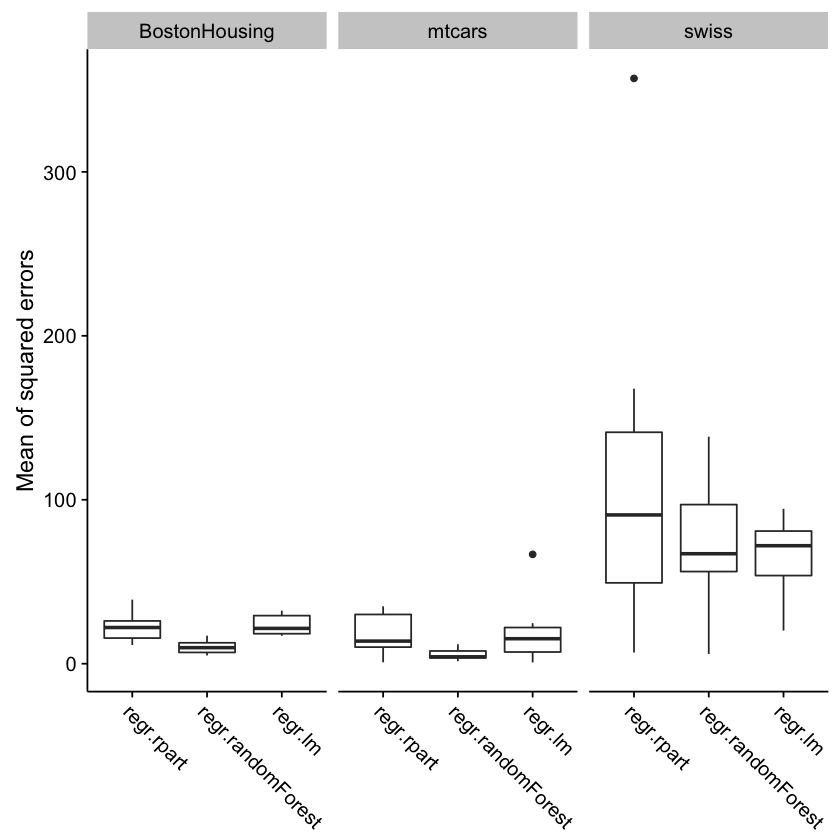

In [99]:
plotBMRBoxplots(bmr, measure = mlr::mse)

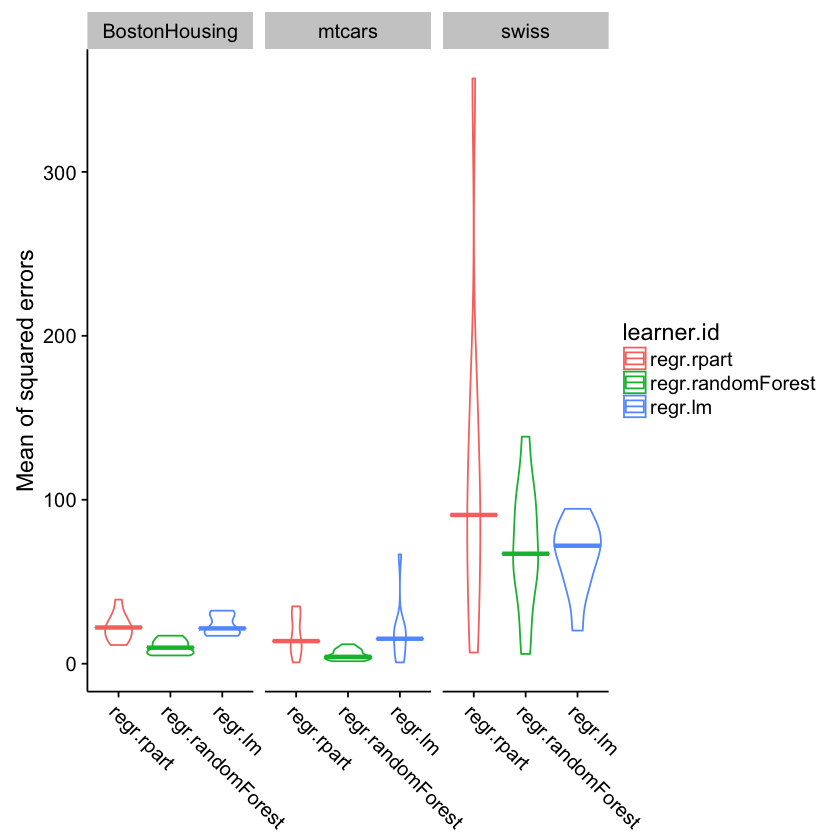

In [100]:
# Some ggplot2 customizations
plotBMRBoxplots(bmr, measure = mlr::mse, style = "violin") + aes(color = learner.id)

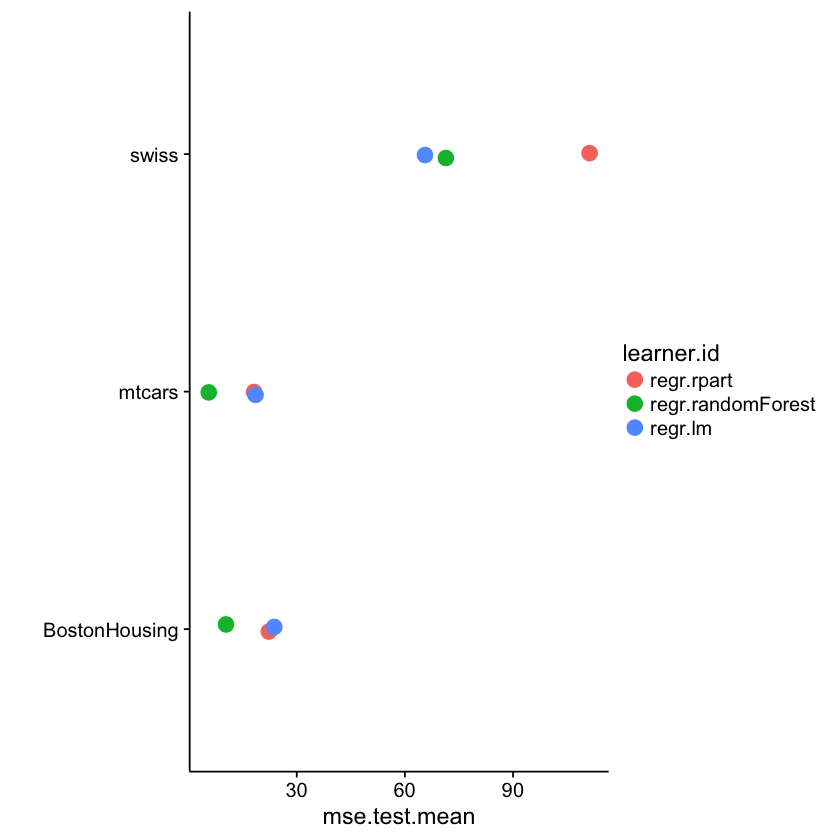

In [101]:
# Summary plot
plotBMRSummary(bmr)

A classification benchmark

In [106]:
# Classification benchmark with OpenML
cv10f = makeResampleDesc("CV", iters = 10)
tasks = list(
    convertOMLTaskToMlr(getOMLTask(task.id=59))$mlr.task,  # iris
    convertOMLTaskToMlr(getOMLTask(task.id=57))$mlr.task,  # ionosphere
    convertOMLTaskToMlr(getOMLTask(task.id=2382))$mlr.task # wine
    )
learners = list(
    makeLearner("classif.rpart"),
    makeLearner("classif.knn"),
    makeLearner("classif.randomForest")
    )
bmr = benchmark(learners, tasks, cv10f, mlr::mmce)
bmr

           task.id           learner.id mmce.test.mean
1 OpenML-Task-2382        classif.rpart     0.13529412
2 OpenML-Task-2382          classif.knn     0.20849673
3 OpenML-Task-2382 classif.randomForest     0.01699346
4   OpenML-Task-57        classif.rpart     0.11658730
5   OpenML-Task-57          classif.knn     0.13388889
6   OpenML-Task-57 classif.randomForest     0.06539683
7   OpenML-Task-59        classif.rpart     0.06666667
8   OpenML-Task-59          classif.knn     0.04000000
9   OpenML-Task-59 classif.randomForest     0.05333333

Benchmark + share automatically on OpenML

In [108]:
task.ids = c(59,57,2382)
for (lrn in learners) {
  for (id in task.ids) {
    task = getOMLTask(id)
    res = runTaskMlr(task, lrn) # shorthand to run OpenML tasks
    run.id = uploadOMLRun(res)  # upload results
  }
}

## Hyperparameter tuning

- Find the 'best' hyperparameters for a given dataset
- Tuners iteratively evaluate hyperparameters and move to next setting
- `mlr` offers many tuners through the same interface
- All info logged in `OptPath` object

### Tuning strategies

- Grid search: exhaustively try all combinations on finite grid
- Random search: draw parameters randomly (scales better)
- Iterated F-Racing: all candidatea are trained in parallel, on increasing amount of data (steps). At each step, models that perform statistically worse than others are dropped
- Model-based (Bayesian) optimization: while evaluating parameter settings, a surrogate model learns the hyperparameter space and predicts interesting parameter settings to try next
- ...

A simple grid search 

In [135]:
task = convertOMLTaskToMlr(getOMLTask(task.id=2073))$mlr.task #yeast
lrn = makeLearner("classif.rpart")
rdesc = makeResampleDesc("CV", iters = 3)
ps = makeParamSet( # Define the grid
    makeIntegerParam("maxdepth", lower = 2, upper = 30),
    makeNumericParam("cp", lower = 0, upper = 0.5)
    )
ctrl = makeTuneControlGrid(resolution=10) # Use a grid search
res = tuneParams(lrn,task, rdesc, par.set = ps, control = ctrl, 
                measures = list(acc, setAggregation(acc, test.sd)))
res

Tune result:
Op. pars: maxdepth=5; cp=0
acc.test.mean=0.572,acc.test.sd=0.00464

Replace the controller to try other tuning strategies
- http://mlr-org.github.io/mlr-tutorial/devel/html/tune/index.html#tuning-hyperparameters

In [141]:
ctrl = makeTuneControlIrace(maxExperiments = 200L) # Iterative F-Racing
ctrl = makeTuneControlRandom(maxit = 200L) # Random Search

In [136]:
res$opt.path
opt.grid = as.data.frame(res$opt.path)
head(opt.grid)

Optimization path
  Dimensions: x = 2/2, y = 2
  Length: 100
  Add x values transformed: FALSE
  Error messages: TRUE. Errors: 0 / 100.
  Exec times: TRUE. Range: 0.056 - 0.18. 0 NAs.

,maxdepth,cp,acc.test.mean,acc.test.sd,dob,eol,error.message,exec.time
1,2,0,0.485849,0.005050532,1,NA,NA,0.065
2,5,0,0.5721057,0.004635381,2,NA,NA,0.069
3,8,0,0.5640126,0.01202452,3,NA,NA,0.093
4,11,0,0.5559154,0.02168465,4,NA,NA,0.086
5,14,0,0.5491732,0.02384237,5,NA,NA,0.107
6,18,0,0.5491732,0.02384237,6,NA,NA,0.105


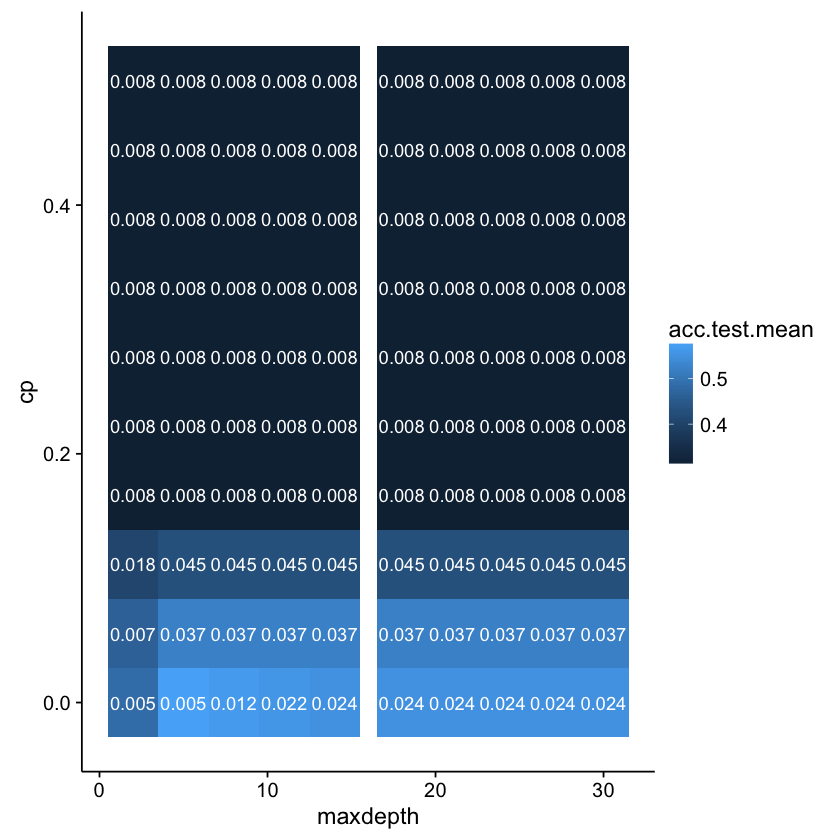

In [137]:
g = ggplot(opt.grid, aes(x = maxdepth, y = cp, fill = acc.test.mean, label = round(acc.test.sd, 3)))
g + geom_tile() + geom_text(color = "white")

### Nested resampling

- Never optimize parameters over the same test data as used for estimating the final performance of the model
- Nested resampling: embed the whole model selection process into an outer resampling loop
- In mlr you can wrap the learner in a tuning procedure with `makeTuneWrapper`

Nested subsampling with 2 iterations in the inner loop (for selecting hyperparameters) and 
3-fold crossvalidation in the outer loop (for final evaluation)

In [146]:
## Inner tuning loop
ctrl = makeTuneControlGrid()
inner = makeResampleDesc("Subsample", iters = 2)
lrn = makeTuneWrapper("classif.rpart", resampling = inner, par.set = ps, control = ctrl, show.info = FALSE)

## Outer resampling loop
outer = makeResampleDesc("CV", iters = 3)
r = resample(lrn, iristask, resampling = outer, extract = getTuneResult, show.info = FALSE)
print(r)

Resample Result
Task: OpenML-Task-59
Learner: classif.rpart.tuned
mmce.aggr: 0.07
mmce.mean: 0.07
mmce.sd: 0.01
Runtime: 51.4186


## ROC analysis

- mlr has support for plotting ROC curves and doing ROC analysis
- http://mlr-org.github.io/mlr-tutorial/devel/html/roc_analysis/index.html

In [180]:
data(Sonar, package = "mlbench")
sonar.task = makeClassifTask(data=Sonar,target="Class")

n = getTaskSize(sonar.task) # make a 2/3 split
train.set = sample(n, size = round(2/3 * n))
test.set = setdiff(seq_len(n), train.set)

lrn1 = makeLearner("classif.kknn", predict.type = "prob") # output probabilities
mod1 = train(lrn1, sonar.task, subset = train.set)
pred1 = predict(mod1, task = sonar.task, subset = test.set)

# Evaluate performance over different thresholds
df = generateThreshVsPerfData(pred1, measures = list(fpr, tpr, mmce))

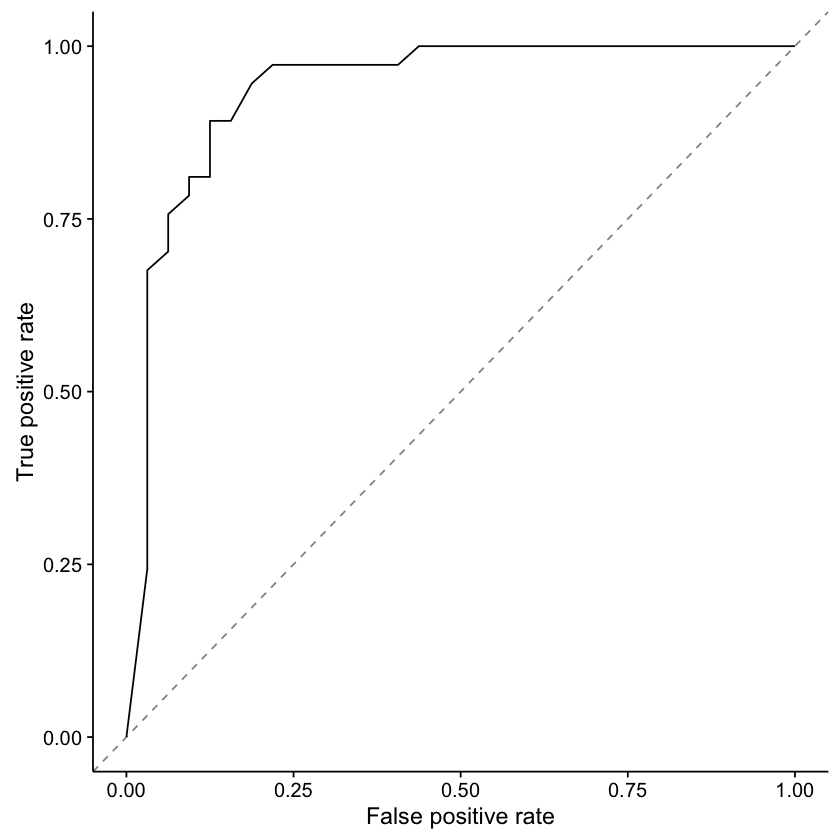

In [181]:
plotROCCurves(df)

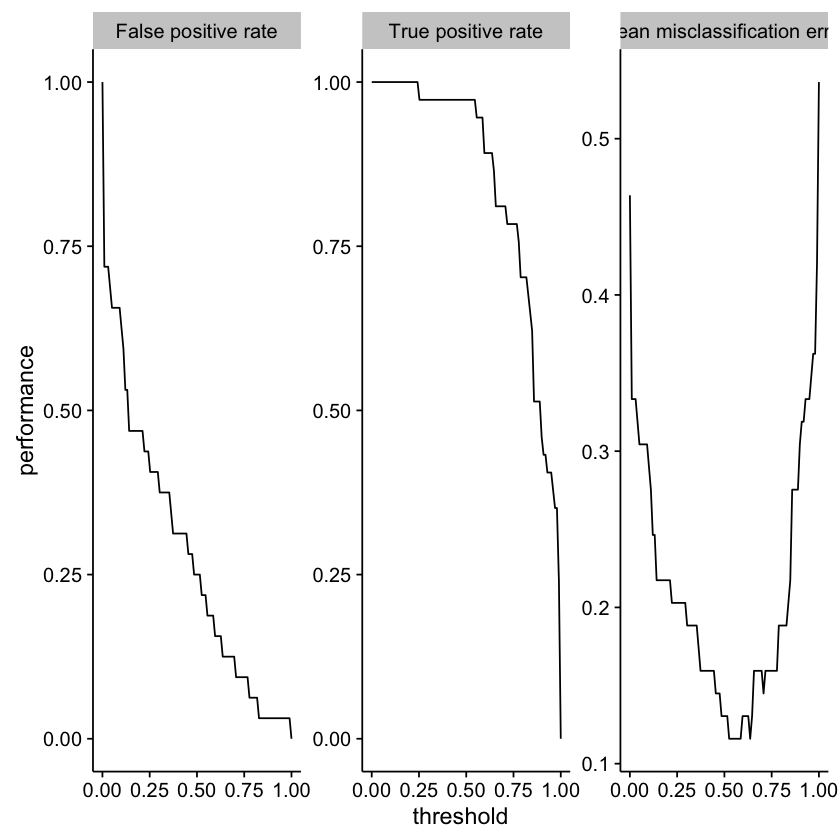

In [182]:
plotThreshVsPerf(df)

Compare learners

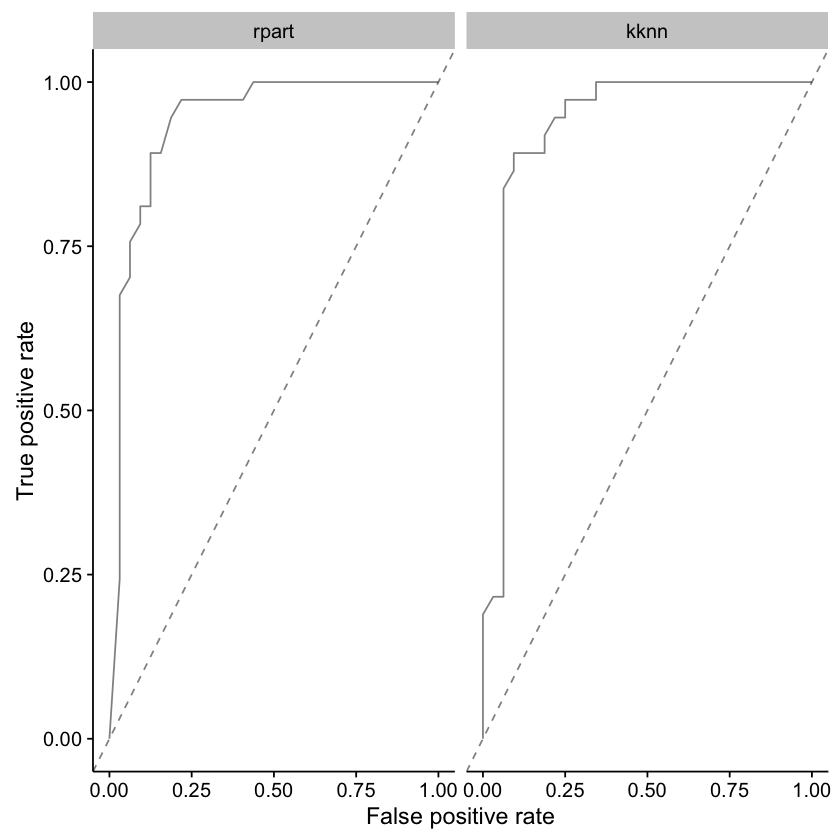

In [183]:
lrn2 = makeLearner("classif.ksvm", predict.type = "prob")
mod2 = train(lrn2, sonar.task, subset = train.set)
pred2 = predict(mod2, task = sonar.task, subset = test.set)
df = generateThreshVsPerfData(list(rpart = pred1, kknn = pred2), measures = list(fpr, tpr))
plotROCCurves(df)

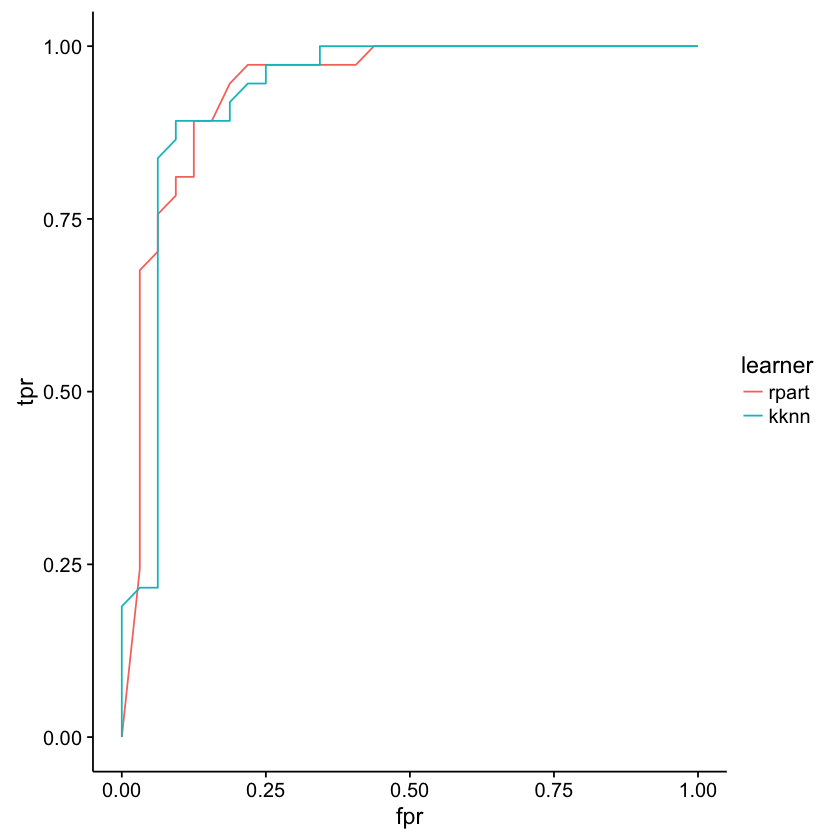

In [184]:
qplot(x = fpr, y = tpr, color = learner, data = df$data, geom = "path")

## Extra: Handling datasets in R
- In R, datasets are represented as R Data Frames
- Here, we show some useful methods. Skip it if you know them.

Also see:
- R Cookbook: http://www.cookbook-r.com/
- DataCamp tutorial: https://www.datacamp.com/community/tutorials/15-easy-solutions-data-frame-problems-r 

### Basics

In [29]:
data(iris, package = "datasets") # Loads dataset iris
str(iris) # Returns a description

'data.frame':	150 obs. of  5 variables:
 $ Sepal.Length: num  5.1 4.9 4.7 4.6 5 5.4 4.6 5 4.4 4.9 ...
 $ Sepal.Width : num  3.5 3 3.2 3.1 3.6 3.9 3.4 3.4 2.9 3.1 ...
 $ Petal.Length: num  1.4 1.4 1.3 1.5 1.4 1.7 1.4 1.5 1.4 1.5 ...
 $ Petal.Width : num  0.2 0.2 0.2 0.2 0.2 0.4 0.3 0.2 0.2 0.1 ...
 $ Species     : Factor w/ 3 levels "setosa","versicolor",..: 1 1 1 1 1 1 1 1 1 1 ...


In [30]:
head(iris) # First few rows
summary(iris) # Summary statistics

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa


  Sepal.Length    Sepal.Width     Petal.Length    Petal.Width   
 Min.   :4.300   Min.   :2.000   Min.   :1.000   Min.   :0.100  
 1st Qu.:5.100   1st Qu.:2.800   1st Qu.:1.600   1st Qu.:0.300  
 Median :5.800   Median :3.000   Median :4.350   Median :1.300  
 Mean   :5.843   Mean   :3.057   Mean   :3.758   Mean   :1.199  
 3rd Qu.:6.400   3rd Qu.:3.300   3rd Qu.:5.100   3rd Qu.:1.800  
 Max.   :7.900   Max.   :4.400   Max.   :6.900   Max.   :2.500  
       Species  
 setosa    :50  
 versicolor:50  
 virginica :50  
                
                
                

In [31]:
names(iris) # All feature names
dim(iris)   # Dimensions
nrow(iris)  # Number of rows / examples
ncol(iris)  # Number of columns / features

[1] "Sepal.Length" "Sepal.Width"  "Petal.Length" "Petal.Width" 
[5] "Species"

[1] 150   5

[1] 150

[1] 5

### Slicing

In [32]:
head(iris$Petal.Length) # Select specific feature
iris[1:5,3]     # Select values in row 1:5, column 3
head(iris[,c("Petal.Length","Petal.Width")]) # Select columns by name
iris[3,]        # Select row 3

[1] 1.4 1.4 1.3 1.5 1.4 1.7

[1] 1.4 1.4 1.3 1.5 1.4

,Petal.Length,Petal.Width
1,1.4,0.2
2,1.4,0.2
3,1.3,0.2
4,1.5,0.2
5,1.4,0.2
6,1.7,0.4


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
3,4.7,3.2,1.3,0.2,setosa


In [33]:
# R will convert a single column to a vector, use drop=FALSE to avoid
head(iris[,c("Petal.Length")])
head(iris[,c("Petal.Length"), drop=FALSE])

[1] 1.4 1.4 1.3 1.5 1.4 1.7

,Petal.Length
1,1.4
2,1.4
3,1.3
4,1.5
5,1.4
6,1.7


### Applying functions

In [34]:
dat = iris[1:8,3:4] # select rows 1-8, columns 3-4
apply(dat, 1, mean)       # computes mean per ROW (=1)
apply(dat, 2, median)     # computes median per COLUMN (=2)

1    2    3    4    5    6    7    8 
0.80 0.80 0.75 0.85 0.80 1.05 0.85 0.85

Petal.Length  Petal.Width 
         1.4          0.2

### Subsetting

In [35]:
head(subset(iris, Petal.Length <= 4 & Petal.Width > 1.2))
head(subset(iris, Species == "setosa"))
head(subset(iris, Species %in% c("setosa", "versicolor")))

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
54,5.5,2.3,4,1.3,versicolor
60,5.2,2.7,3.9,1.4,versicolor
65,5.6,2.9,3.6,1.3,versicolor
72,6.1,2.8,4,1.3,versicolor
90,5.5,2.5,4,1.3,versicolor


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa


In [36]:
# Use droplevels to actually remove unused feature values (levels) from the dataset
onlysetosa = subset(iris, Species == "setosa")
str(onlysetosa)
str(droplevels(onlysetosa))

'data.frame':	50 obs. of  5 variables:
 $ Sepal.Length: num  5.1 4.9 4.7 4.6 5 5.4 4.6 5 4.4 4.9 ...
 $ Sepal.Width : num  3.5 3 3.2 3.1 3.6 3.9 3.4 3.4 2.9 3.1 ...
 $ Petal.Length: num  1.4 1.4 1.3 1.5 1.4 1.7 1.4 1.5 1.4 1.5 ...
 $ Petal.Width : num  0.2 0.2 0.2 0.2 0.2 0.4 0.3 0.2 0.2 0.1 ...
 $ Species     : Factor w/ 3 levels "setosa","versicolor",..: 1 1 1 1 1 1 1 1 1 1 ...
'data.frame':	50 obs. of  5 variables:
 $ Sepal.Length: num  5.1 4.9 4.7 4.6 5 5.4 4.6 5 4.4 4.9 ...
 $ Sepal.Width : num  3.5 3 3.2 3.1 3.6 3.9 3.4 3.4 2.9 3.1 ...
 $ Petal.Length: num  1.4 1.4 1.3 1.5 1.4 1.7 1.4 1.5 1.4 1.5 ...
 $ Petal.Width : num  0.2 0.2 0.2 0.2 0.2 0.4 0.3 0.2 0.2 0.1 ...
 $ Species     : Factor w/ 1 level "setosa": 1 1 1 1 1 1 1 1 1 1 ...


### Removing and adding rows

In [37]:
small_iris = iris[iris$Sepal.Length < 4.5,] # Remove rows based on test
head(small_iris)
new_row = c(4.0, 3.0, 1.0, 0.2, "setosa")
small_iris = rbind(small_iris, new_row)
head(small_iris)

,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
9,4.4,2.9,1.4,0.2,setosa
14,4.3,3,1.1,0.1,setosa
39,4.4,3,1.3,0.2,setosa
43,4.4,3.2,1.3,0.2,setosa


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
9,4.4,2.9,1.4,0.2,setosa
14,4.3,3,1.1,0.1,setosa
39,4.4,3,1.3,0.2,setosa
43,4.4,3.2,1.3,0.2,setosa
5,4,3,1,0.2,setosa


### Removing and adding columns

In [38]:
sepalwidth = iris$Sepal.Width
iris$Sepal.Width = NULL # Remove column Sepal.Width
head(iris)
iris$Sepal.Width = sepalwidth # Add it again
head(iris)
iris = iris[c("Sepal.Length","Sepal.Width","Petal.Length","Petal.Width","Species")] #Reorder
head(iris)

,Sepal.Length,Petal.Length,Petal.Width,Species
1,5.1,1.4,0.2,setosa
2,4.9,1.4,0.2,setosa
3,4.7,1.3,0.2,setosa
4,4.6,1.5,0.2,setosa
5,5,1.4,0.2,setosa
6,5.4,1.7,0.4,setosa


,Sepal.Length,Petal.Length,Petal.Width,Species,Sepal.Width
1,5.1,1.4,0.2,setosa,3.5
2,4.9,1.4,0.2,setosa,3
3,4.7,1.3,0.2,setosa,3.2
4,4.6,1.5,0.2,setosa,3.1
5,5,1.4,0.2,setosa,3.6
6,5.4,1.7,0.4,setosa,3.9


,Sepal.Length,Sepal.Width,Petal.Length,Petal.Width,Species
1,5.1,3.5,1.4,0.2,setosa
2,4.9,3,1.4,0.2,setosa
3,4.7,3.2,1.3,0.2,setosa
4,4.6,3.1,1.5,0.2,setosa
5,5,3.6,1.4,0.2,setosa
6,5.4,3.9,1.7,0.4,setosa


### Generating data
Several R packages allow you to generate synthetic data

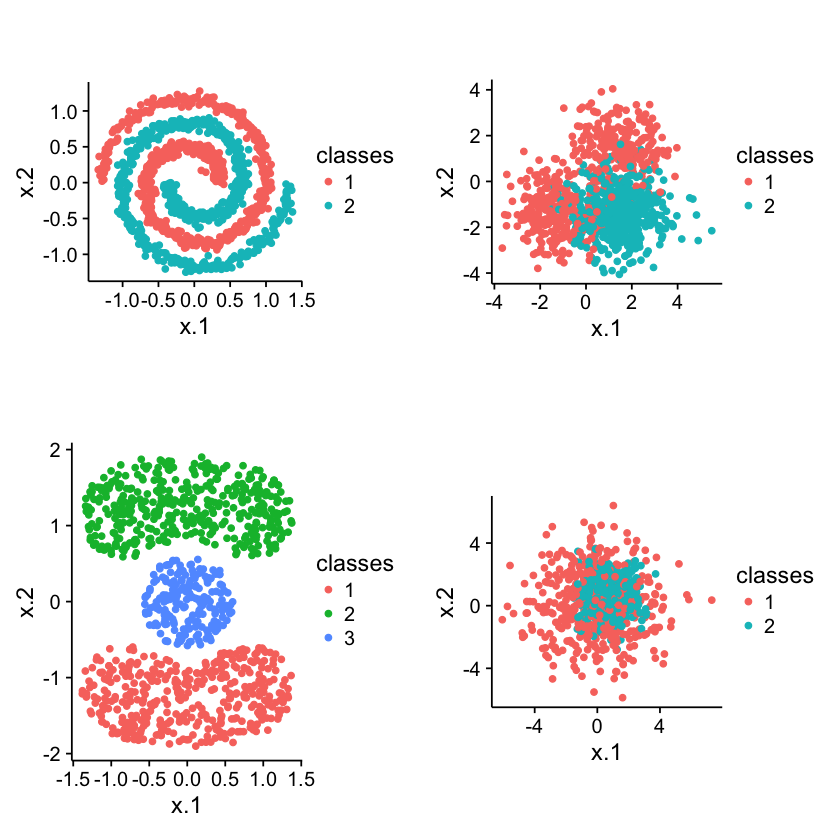

In [39]:
library(mlbench)
newdata = as.data.frame(mlbench.spirals(n=1000, cycles=1.5, sd=0.05))
spirals = ggplot(data=newdata, aes(x=x.1, y=x.2, color=classes)) + geom_point() + coord_fixed(ratio=1)
newdata = as.data.frame(mlbench.threenorm(n=1000, d=2))
blobs = ggplot(data=newdata, aes(x=x.1, y=x.2, color=classes)) + geom_point() + coord_fixed(ratio=1)
newdata = as.data.frame(mlbench.cassini(n=1000, relsize=c(2,2,1)))
waves = ggplot(data=newdata, aes(x=x.1, y=x.2, color=classes)) + geom_point() + coord_fixed(ratio=1)
newdata = as.data.frame(mlbench.ringnorm(n=1000, d=2))
shapes = ggplot(data=newdata, aes(x=x.1, y=x.2, color=classes)) + geom_point() + coord_fixed(ratio=1)
grid.arrange(spirals, blobs, waves, shapes, ncol=2, nrow =2)

### Visualizing data (ggplot)

- http://www.cookbook-r.com/Graphs/index.html
- https://www.rstudio.com/wp-content/uploads/2015/03/ggplot2-cheatsheet.pdf

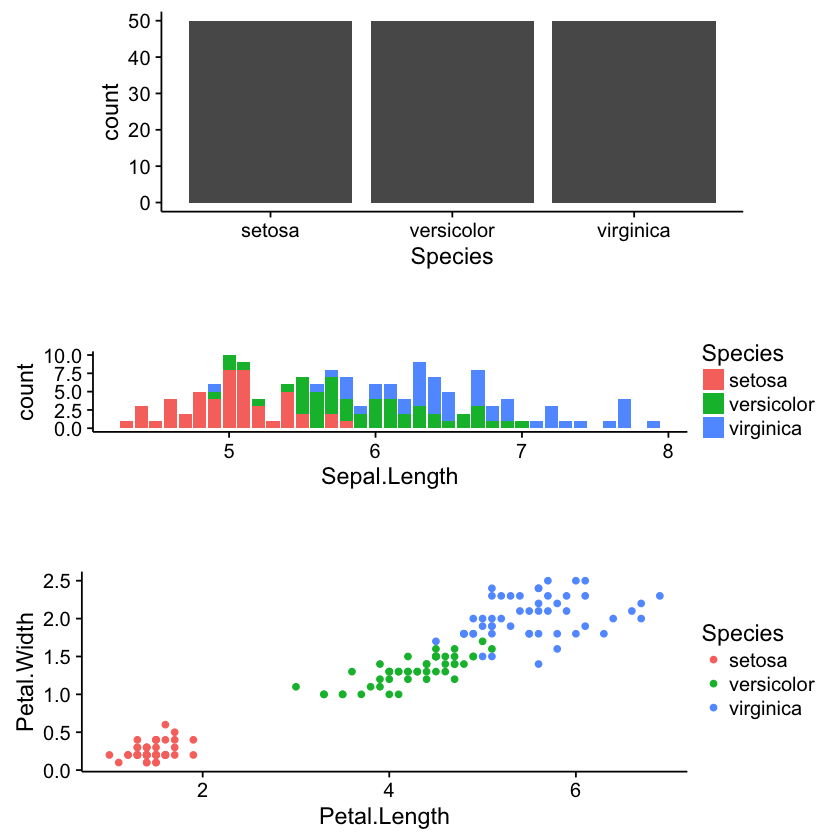

In [40]:
# Class distribution
plotclass = ggplot(data=iris, aes(x=Species)) + geom_bar(stat="count") + coord_fixed(ratio=0.02)
#  feature
plotpetal = ggplot(data=iris, aes(x=Sepal.Length, fill=Species)) + geom_bar(stat="count") + coord_fixed(ratio=0.05)
# Plot lym_nodes_dimin against lym_nodes_enlar
plotdim = ggplot(data=iris, aes(x=Petal.Length, y=Petal.Width, color=Species)) + geom_point()
grid.arrange(plotclass, plotpetal, plotdim, ncol = 1)